**ALL LIBRARY REQUIRED**

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, auc
from scipy.stats import sem
import joblib
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

***DATA PREPROCESSING***

In [2]:
"""
# Load the dataset
url = 'https://p16-bot-sign-sg.ciciai.com/tos-alisg-i-b2l6bve69y-sg/0a542996a2e74931b9a17cc3fb593feb.csv~tplv-b2l6bve69y-image.image?rk3s=68e6b6b5&x-expires=1719816096&x-signature=hvoff8lKbCLE4lp7Nfk5Cir9yn4%3D'
data = pd.read_csv(url)

# Handling Missing Values
# Fill missing values with the mean of the column
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
ordinal_binary_cols = ['HighChol', 'CholCheck', 'Smoker', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'DiffWalk', 'Stroke', 'HighBP', 'Diabetes']

for col in numerical_cols:
    if col not in ordinal_binary_cols:
        data[col].fillna(data[col].mean(), inplace=True)

# Normalizing Numerical Features
scaler = StandardScaler()
for col in numerical_cols:
    if col not in ordinal_binary_cols:
        data[col] = scaler.fit_transform(data[[col]])

#data cleaning
data.dropna(inplace=True)

# Save the preprocessed dataset
data.to_csv('preprocessed_data.csv', index=False)

print('Preprocessing completed. Preprocessed data saved as preprocessed_data.csv')
print('Preprocessed data preview:')
print(data.head(), '\n')
"""

"\n# Load the dataset\nurl = 'https://p16-bot-sign-sg.ciciai.com/tos-alisg-i-b2l6bve69y-sg/0a542996a2e74931b9a17cc3fb593feb.csv~tplv-b2l6bve69y-image.image?rk3s=68e6b6b5&x-expires=1719816096&x-signature=hvoff8lKbCLE4lp7Nfk5Cir9yn4%3D'\ndata = pd.read_csv(url)\n\n# Handling Missing Values\n# Fill missing values with the mean of the column\nnumerical_cols = data.select_dtypes(include=['float64', 'int64']).columns\nordinal_binary_cols = ['HighChol', 'CholCheck', 'Smoker', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'DiffWalk', 'Stroke', 'HighBP', 'Diabetes']\n\nfor col in numerical_cols:\n    if col not in ordinal_binary_cols:\n        data[col].fillna(data[col].mean(), inplace=True)\n\n# Normalizing Numerical Features\nscaler = StandardScaler()\nfor col in numerical_cols:\n    if col not in ordinal_binary_cols:\n        data[col] = scaler.fit_transform(data[[col]])\n\n#data cleaning\ndata.dropna(inplace=True)\n\n# Save the preprocessed dataset\ndata.

***SAMPLING***

In [3]:
# Load the preprocessed dataset
data = pd.read_csv('preprocessed_data.csv')

features = ['Age', 'Sex', 'BMI']
X = data[features]
y = data['Diabetes']
y = y.apply(lambda x: 1 if x > 0 else 0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [4]:
# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

***Neutral Network***

In [5]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).shuffle(buffer_size=1024).batch(32)
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(32)

***MODEL BUILDING*** ***(NEUTRAL NETWORK)***

In [6]:
# Define Neural Network model
class NeuralNetworkModel(tf.keras.Model):
    def __init__(self, input_dim):
        super(NeuralNetworkModel, self).__init__()
        self.dense1 = tf.keras.layers.Dense(64, activation='relu')
        self.dense2 = tf.keras.layers.Dense(32, activation='relu')
        self.output_layer = tf.keras.layers.Dense(1, activation='sigmoid')
    
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        return self.output_layer(x)

# Initialize model, loss function, and optimizer
input_dim = X_train.shape[1]
binary_crossentropy = tf.keras.losses.BinaryCrossentropy()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

*Initialize the models, loss functions, and optimizer*

**MODEL TRAINING**

In [7]:
def train_step(model, X, y):
    with tf.GradientTape() as tape:
        predictions = model(X)
        loss = binary_crossentropy(y, predictions)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return loss

# Training the model
def train_model(model, train_dataset, epochs=10):
    for epoch in range(epochs):
        epoch_loss = 0
        for step, (X_batch, y_batch) in enumerate(train_dataset):
            print(f"Batch {step + 1}, X_batch shape: {X_batch.shape}, y_batch shape: {y_batch.shape}")
            loss = train_step(model, X_batch, y_batch)
            epoch_loss += loss
        print(f'Epoch {epoch + 1}, Loss: {epoch_loss / (step + 1):.4f}')

In [8]:
# Evaluate the model
def evaluate_model(model, X_test, y_test):
    logits = model(X_test)
    predictions = tf.round(logits)
    predictions = tf.squeeze(predictions)
    y_test_numpy = y_test.numpy()
    predictions_numpy = predictions.numpy()
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test_numpy, predictions_numpy)
    
    # Calculate precision
    precision = precision_score(y_test_numpy, predictions_numpy)
    
    # Calculate sensitivity (recall)
    recall = recall_score(y_test_numpy, predictions_numpy)
    
    # Calculate F1 score
    f1 = f1_score(y_test_numpy, predictions_numpy)
    
    # Calculate confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test_numpy, predictions_numpy).ravel()

    # Calculate ROC AUC
    probabilities = logits.numpy()
    roc_auc = roc_auc_score(y_test_numpy, probabilities)
    
    return accuracy, precision, recall, f1, roc_auc, tn, fp, fn, tp

In [9]:
# Convert data to TensorFlow datasets
def get_train_dataset(X_train, y_train):
    return tf.data.Dataset.from_tensor_slices((X_train, y_train)).shuffle(buffer_size=1024).batch(32)

# Initialize metrics list and best model variables
nn_metrics = []
best_nn_model = None
best_nn_score = -np.inf

# Function to perform bootstrap resampling and calculate metrics
def bootstrap_evaluation(X_train, y_train, X_test, y_test, n_iterations=3):
    global best_nn_model, best_nn_score
    
    for i in range(n_iterations):
        print(f'Iteration {i + 1}/{n_iterations}')
        
        # Resample the test dataset
        X_test_resampled, y_test_resampled = resample(X_test, y_test, n_samples=len(X_test), random_state=None)

        # Convert resampled data to TensorFlow tensors
        X_test_resampled_tensor = tf.convert_to_tensor(X_test_resampled, dtype=tf.float32)
        y_test_resampled_tensor = tf.convert_to_tensor(y_test_resampled.values, dtype=tf.float32)
        
        # Initialize a new instance of the model for each iteration
        model = NeuralNetworkModel(input_dim)
        
        # Get the training dataset
        train_dataset = get_train_dataset(X_train, y_train)
        
        # Train the model
        train_model(model, train_dataset, epochs=30)
        
        # Evaluate the model on the resampled dataset
        nn_metric_evaluation = evaluate_model(model, X_test_resampled_tensor, y_test_resampled_tensor)
    
        # Store the best model based on accuracy
        if nn_metric_evaluation[0] > best_nn_score:
            best_nn_score = nn_metric_evaluation[0]
            best_nn_model = model
            # Save the best model
            best_nn_model.save('model/best_nn_model[2]')

        nn_metrics.append(nn_metric_evaluation)


# Perform bootstrap evaluation
bootstrap_evaluation(X_train, y_train, X_test, y_test)


Iteration 1/3
Batch 1, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 2, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 3, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 4, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 5, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 6, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 7, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 8, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 9, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 10, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 11, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 12, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 13, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 14, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 15, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 16, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 17, X_batch shape: (32, 3), y_batch shape: (32,)
Batch 18, X_batch shape: (32, 3), y_batch shape: (32,)
Batch

***Confusion Matric***

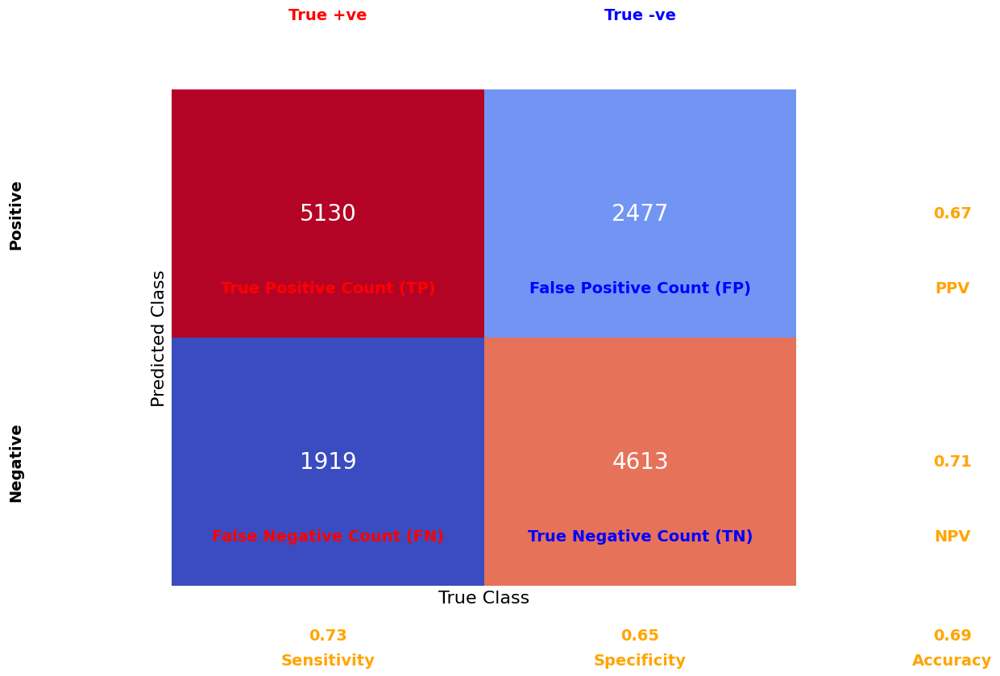

In [10]:
# Plot confusion matrix function
def plot_confusion_matrix(metrics):
    accuracy, precision, recall, f1, roc_auc, tn, fp, fn, tp = metrics
    
    # Calculate additional metrics
    ppv = precision  # Positive Predictive Value
    npv = tn / (tn + fn)  # Negative Predictive Value
    sensitivity = recall  # Sensitivity (recall)
    specificity = tn / (tn + fp)  # Specificity
    
    # Create a confusion matrix array
    cm = np.array([[tp, fp], [fn, tn]])
    
    # Create a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False, annot_kws={"size": 20})
    
    # Set labels
    plt.xlabel('True Class', fontsize=16)
    plt.ylabel('Predicted Class', fontsize=16)
    
    # Add custom text to the confusion matrix plot
    plt.text(0.5, -0.3, 'True +ve', ha='center', va='center', fontsize=14, color='red', weight='bold')
    plt.text(1.5, -0.3, 'True -ve', ha='center', va='center', fontsize=14, color='blue', weight='bold')
    plt.text(-0.5, 0.5, 'Positive', ha='center', va='center', fontsize=14, color='black', weight='bold', rotation=90)
    plt.text(-0.5, 1.5, 'Negative', ha='center', va='center', fontsize=14, color='black', weight='bold', rotation=90)
    
    plt.text(0.5, 0.8, 'True Positive Count (TP)', ha='center', va='center', fontsize=14, color='red', weight='bold')
    plt.text(1.5, 0.8, 'False Positive Count (FP)', ha='center', va='center', fontsize=14, color='blue', weight='bold')
    plt.text(0.5, 1.8, 'False Negative Count (FN)', ha='center', va='center', fontsize=14, color='red', weight='bold')
    plt.text(1.5, 1.8, 'True Negative Count (TN)', ha='center', va='center', fontsize=14, color='blue', weight='bold')
    
    # Add metrics labels
    plt.text(2.5, 0.8, 'PPV', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(2.5, 1.8, 'NPV', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(0.5, 2.3, 'Sensitivity', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(1.5, 2.3, 'Specificity', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(2.5, 2.3, 'Accuracy', ha='center', va='center', fontsize=14, weight='bold', color='orange')

    # Add metrics values
    plt.text(2.5, 0.5, f'{ppv:.2f}', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(2.5, 1.5, f'{npv:.2f}', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(0.5, 2.2, f'{sensitivity:.2f}', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(1.5, 2.2, f'{specificity:.2f}', ha='center', va='center', fontsize=14, weight='bold', color='orange')
    plt.text(2.5, 2.2, f'{accuracy:.2f}', ha='center', va='center', fontsize=14, weight='bold', color='orange')

    plt.xticks([])
    plt.yticks([])
    plt.show()

# Convert to tensor
X_test1 = tf.convert_to_tensor(X_test, dtype=tf.float32)
y_test1 = tf.convert_to_tensor(y_test.values, dtype=tf.float32)

# Example usage
best_nn_eva_metrics = evaluate_model(best_nn_model, X_test1, y_test1)
plot_confusion_matrix(best_nn_eva_metrics)


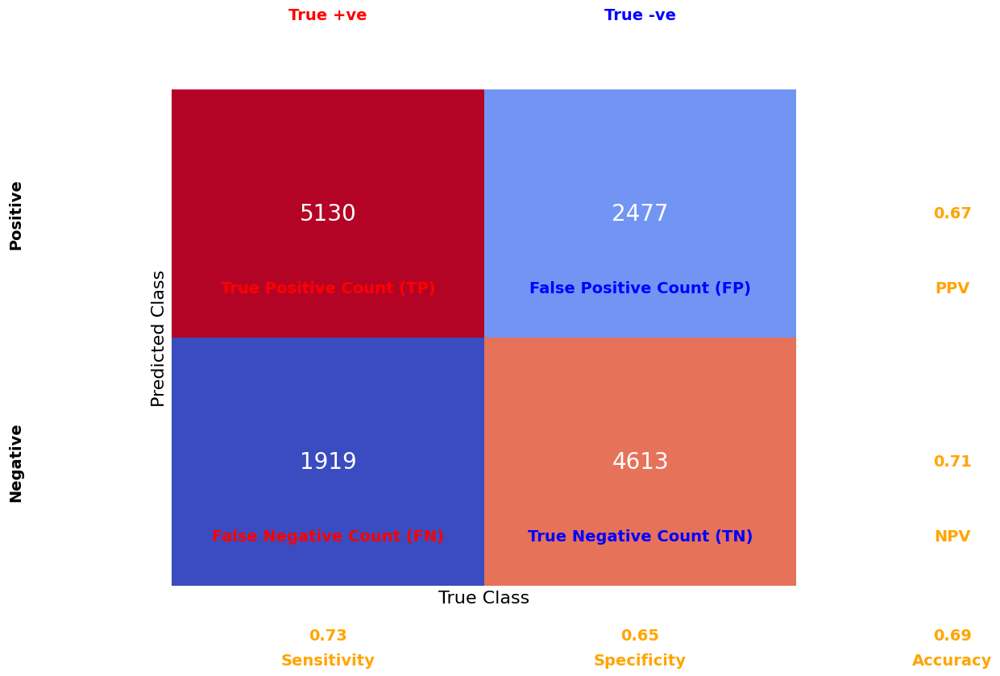

In [11]:
def plot_confusion_matrix1(metrics):
    # Unpack metrics
    accuracy, precision, recall, f1, roc_auc, tn, fp, fn, tp = metrics     

    # Create a DataFrame from the confusion matrix with appropriate row and column names
    cm_df = pd.DataFrame([[tp, fp], [fn, tn]], index=['Actual Positive', 'Actual Negative'], columns=['Predicted Positive', 'Predicted Negative'])

    # Plot the confusion matrix with better aesthetics
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', linewidths=.5)
    plt.title('Confusion Matrix', fontsize=16)
    plt.ylabel('Actual Label', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

#call the function
plot_confusion_matrix(best_nn_eva_metrics)

C:\Users\jiach\AppData\Local\Temp\ipykernel_41708\1302660365.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  cm_df = cm_df.apply(pd.to_numeric, errors='ignore')


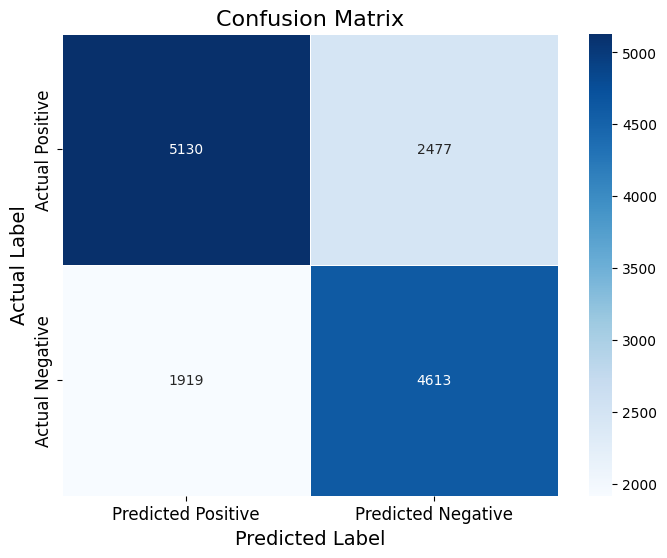

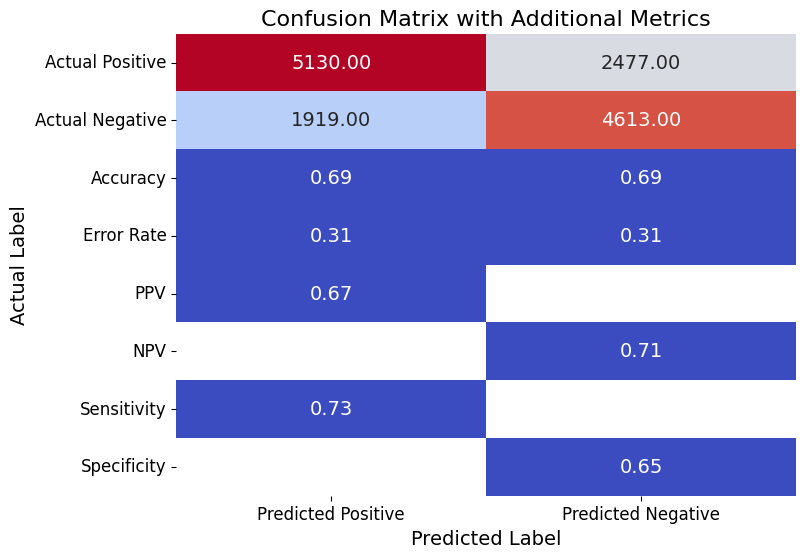

In [12]:
def plot_confusion_matrix2(metrics):
    # Unpack metrics
    accuracy, precision, recall, f1, roc_auc, tn, fp, fn, tp = metrics     

    cm_df = pd.DataFrame([[tp, fp], [fn, tn]], index=['Actual Positive', 'Actual Negative'], columns=['Predicted Positive', 'Predicted Negative'])

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', linewidths=.5)
    plt.title('Confusion Matrix', fontsize=16)
    plt.ylabel('Actual Label', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    # Calculate the metrics
    Accuracy = (tp + tn) / sum([tp, fp, fn, tn])
    Error_rate = (fp + fn) / sum([tp, fp, fn, tn])
    PPV = tp / (tp + fp)
    NPV = tn / (fn + tn)
    Sensitivity = tp / (tp + fn)
    Specificity = tn / (fp + tn)

    # Create a DataFrame from the confusion matrix with appropriate row and column names

    # Add the calculated metrics to the DataFrame
    cm_df.loc['Accuracy'] = ['{:.2f}'.format(Accuracy), '{:.2f}'.format(Accuracy)]
    cm_df.loc['Error Rate'] = ['{:.2f}'.format(Error_rate), '{:.2f}'.format(Error_rate)]
    cm_df.loc['PPV'] = ['{:.2f}'.format(PPV), None]
    cm_df.loc['NPV'] = [None, '{:.2f}'.format(NPV)]
    cm_df.loc['Sensitivity'] = ['{:.2f}'.format(Sensitivity), None]
    cm_df.loc['Specificity'] = [None, '{:.2f}'.format(Specificity)]

    cm_df = cm_df.apply(pd.to_numeric, errors='ignore')
    # Plot the confusion matrix with better aesthetics
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='.2f', cmap='coolwarm', cbar=False, annot_kws={"size": 14})
    plt.title('Confusion Matrix with Additional Metrics', fontsize=16)
    plt.ylabel('Actual Label', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

#call the function
plot_confusion_matrix2(best_nn_eva_metrics)

In [13]:
# Convert data to TensorFlow tensors
X_train_tensor = tf.convert_to_tensor(X_train, dtype=tf.float32)
X_test_tensor = tf.convert_to_tensor(X_test, dtype=tf.float32)
y_train_tensor = tf.convert_to_tensor(y_train.values, dtype=tf.float32)
y_test_tensor = tf.convert_to_tensor(y_test.values, dtype=tf.float32)


**MODEL BUILDING (SVM)**

In [14]:
class SVMModel(tf.keras.Model):
    def __init__(self, input_dim):
        super(SVMModel, self).__init__()
        self.linear = tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l2(0.01))
    
    def call(self, inputs):
        return self.linear(inputs)

*Initialize the models, loss functions, and optimizer*

In [15]:
input_dim = X_train.shape[1]
binary_crossentropy = tf.keras.losses.BinaryCrossentropy()
hinge_loss = tf.keras.losses.Hinge()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

***MODEL_TRAINING***

In [16]:
def train_model(model, X_train, y_train, loss_fn, epochs=100):
    for epoch in range(epochs):
        with tf.GradientTape() as tape:
            logits = model(X_train)
            loss = loss_fn(y_train, logits)
            regularization_loss = tf.reduce_sum(model.losses)
            total_loss = loss + regularization_loss
        
        gradients = tape.gradient(total_loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))
        
        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], Loss: {total_loss.numpy():.4f}')


**MODEL EVALUATION**

In [17]:
def evaluate_model(model, X_test, y_test):
    logits = model(X_test)
    predictions = tf.sign(logits)
    predictions = tf.squeeze(predictions)
    y_test_numpy = y_test.numpy()
    predictions_numpy = (predictions.numpy() + 1) / 2  # Convert -1/1 to 0/1
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test_numpy, predictions_numpy)
    
    # Calculate precision
    precision = precision_score(y_test_numpy, predictions_numpy)
    
    # Calculate sensitivity (recall)
    recall = recall_score(y_test_numpy, predictions_numpy)
    
    # Calculate F1 score
    f1 = f1_score(y_test_numpy, predictions_numpy)
    
    # Calculate confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test_numpy, predictions_numpy).ravel()

    # Calculate ROC AUC
    probabilities = tf.sigmoid(logits).numpy()
    roc_auc = roc_auc_score(y_test_numpy, probabilities)
    
    return accuracy, precision, recall, f1, roc_auc, tn, fp, fn, tp

***100 evaluations using bootstrapping***

In [18]:
num_evaluations = 100
svm_metrics = []
best_svm_model = None
best_svm_score = -np.inf

for _ in range(num_evaluations):
    # Bootstrap sampling
    X_resampled, y_resampled = resample(X_train, y_train, n_samples=len(X_train), random_state=None)
    svm_model = SVMModel(input_dim)
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
    
    # Convert resampled data to TensorFlow tensors
    X_resampled_tensor = tf.convert_to_tensor(X_resampled, dtype=tf.float32)
    y_resampled_tensor = tf.convert_to_tensor(y_resampled.values, dtype=tf.float32)
    
    # Train the SVM model
    print("Training SVM Model")
    train_model(svm_model, X_resampled_tensor, y_resampled_tensor, hinge_loss)
    
    
    # Evaluate the SVM model
    svm_metrics_evaluation = evaluate_model(svm_model, X_test_tensor, y_test_tensor)
    svm_metrics.append(svm_metrics_evaluation)
    
    # Save the best SVM model
    if svm_metrics_evaluation[0] > best_svm_score:
        best_svm_score = svm_metrics_evaluation[0]
        best_svm_model = svm_model

# Save the best models
best_svm_model.save('model/best_svm_model[2]')

Training SVM Model
Epoch [10/100], Loss: 1.3136
Epoch [20/100], Loss: 1.2291
Epoch [30/100], Loss: 1.1508
Epoch [40/100], Loss: 1.0810
Epoch [50/100], Loss: 1.0198
Epoch [60/100], Loss: 0.9673
Epoch [70/100], Loss: 0.9223
Epoch [80/100], Loss: 0.8846
Epoch [90/100], Loss: 0.8544
Epoch [100/100], Loss: 0.8297
Training SVM Model
Epoch [10/100], Loss: 0.8932
Epoch [20/100], Loss: 0.8544
Epoch [30/100], Loss: 0.8248
Epoch [40/100], Loss: 0.8033
Epoch [50/100], Loss: 0.7868
Epoch [60/100], Loss: 0.7735
Epoch [70/100], Loss: 0.7626
Epoch [80/100], Loss: 0.7543
Epoch [90/100], Loss: 0.7482
Epoch [100/100], Loss: 0.7438
Training SVM Model
Epoch [10/100], Loss: 1.6255
Epoch [20/100], Loss: 1.5334
Epoch [30/100], Loss: 1.4454
Epoch [40/100], Loss: 1.3630
Epoch [50/100], Loss: 1.2874
Epoch [60/100], Loss: 1.2190
Epoch [70/100], Loss: 1.1574
Epoch [80/100], Loss: 1.1006
Epoch [90/100], Loss: 1.0463
Epoch [100/100], Loss: 0.9933
Training SVM Model
Epoch [10/100], Loss: 1.1604
Epoch [20/100], Loss: 

C:\Users\jiach\AppData\Local\Temp\ipykernel_41708\1302660365.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  cm_df = cm_df.apply(pd.to_numeric, errors='ignore')


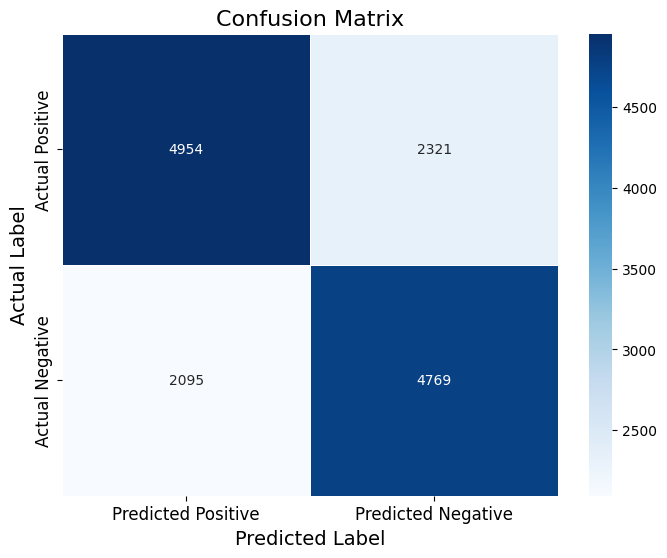

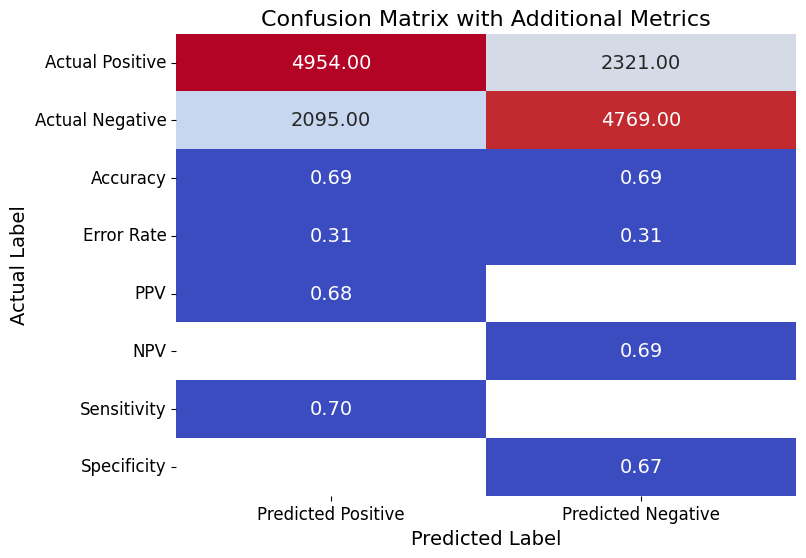

In [19]:
# Draw confusion matrix

best_svm_eva_metrics = evaluate_model(best_svm_model, X_test_tensor, y_test_tensor)
plot_confusion_matrix2(best_svm_eva_metrics)

***Confidence Interval (95%)***

In [20]:
def calculate_confidence_interval(data, confidence=0.95):
    n = len(data)
    mean = np.mean(data)
    se = sem(data)
    margin_of_error = se * 1.96  # For 95% confidence interval
    return mean, margin_of_error

#Calculate average metrics for NN
nn_metrics_array = np.array(nn_metrics)
nn_mean_metrics = np.mean(nn_metrics_array, axis=0) 

# Calculate average metrics for SVM
svm_metrics_array = np.array(svm_metrics)
svm_mean_metrics = np.mean(svm_metrics_array, axis=0)

svm_cis = [calculate_confidence_interval(svm_metrics_array[:, i]) for i in range(svm_metrics_array.shape[1])]
nn_cis = [calculate_confidence_interval(nn_metrics_array[:, i]) for i in range(nn_metrics_array.shape[1])]

***EVALUTION RESULT***

In [21]:
pd.set_option('display.max_columns', None)  # No limit on the number of columns
pd.set_option('display.width', None)        # No limit on the console display width

# Create a performance comparison table
metrics_names = ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'F1 Score', 'ROC AUC', 'TN', 'FP', 'FN', 'TP']
comparison_df = pd.DataFrame({
    'Metric': metrics_names,
    'SVM Mean': svm_mean_metrics,
    'NeuralNetwor Mean': nn_mean_metrics,
    'SVM CI（95%）': [f'{ci[0]:.4f} ± {ci[1]:.4f}' for ci in svm_cis],
    'NeuralNetwor CI（95%）': [f'{ci[0]:.4f} ± {ci[1]:.4f}' for ci in nn_cis]
})
print(comparison_df)
# Output DataFrame to a CSV file
comparison_df.to_csv('performance\insight[2].csv', index=False)


                 Metric     SVM Mean  NeuralNetwor Mean           SVM CI（95%）  \
0              Accuracy     0.650082           0.689441       0.6501 ± 0.0098   
1             Precision     0.641642           0.677822       0.6416 ± 0.0094   
2  Sensitivity (Recall)     0.685309           0.718406       0.6853 ± 0.0193   
3              F1 Score     0.658739           0.697495       0.6587 ± 0.0116   
4               ROC AUC     0.705611           0.758326       0.7056 ± 0.0133   
5                    TN  4360.770000        4685.000000  4360.7700 ± 129.8459   
6                    FP  2729.230000        2406.333333  2729.2300 ± 129.8459   
7                    FN  2218.260000        1984.666667  2218.2600 ± 135.8246   
8                    TP  4830.740000        5063.000000  4830.7400 ± 135.8246   

  NeuralNetwor CI（95%）  
0      0.6894 ± 0.0049  
1      0.6778 ± 0.0056  
2      0.7184 ± 0.0129  
3      0.6975 ± 0.0073  
4      0.7583 ± 0.0061  
5  4685.0000 ± 42.7172  
6  2406.3333 ±

***Cost Benefit Analysis (CBA)***

In [22]:
# Define the cost-benefit analysis function
def cost_benefit_analysis(tn, fp, fn, tp, cost_benefit_matrix):
    return tn * cost_benefit_matrix[0][0] + fp * cost_benefit_matrix[0][1] + fn * cost_benefit_matrix[1][0] + tp * cost_benefit_matrix[1][1]


# Define a hypothetical cost-benefit matrix
cost_benefit_matrix = np.array([[0, -1], [-5, 1]])
# Perform cost-benefit analysis for the best models

best_svm_metrics = evaluate_model(best_svm_model, X_test_tensor, y_test_tensor)
best_nn_metrics = evaluate_model(best_nn_model, X_test_tensor, y_test_tensor)

svm_cost_benefit = cost_benefit_analysis(*best_svm_metrics[5:], cost_benefit_matrix) 
nn_cost_benefit = cost_benefit_analysis(*best_nn_metrics[5:], cost_benefit_matrix)

print(f'Cost-Benefit Analysis for SVM: {svm_cost_benefit}')
print(f'Cost-Benefit Analysis for NN: {nn_cost_benefit}')

Cost-Benefit Analysis for SVM: -7842
Cost-Benefit Analysis for NN: -41


***ROC Plot***

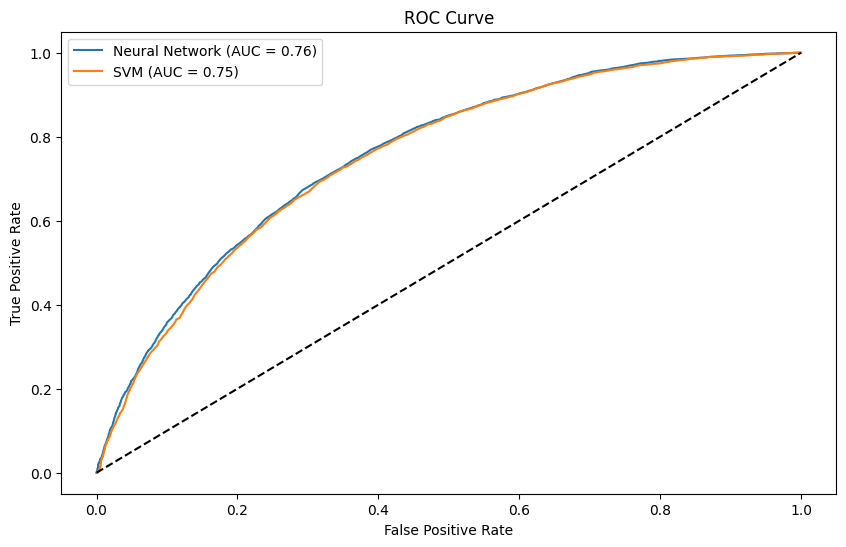

In [23]:
svm_probabilities = tf.sigmoid(best_svm_model(X_test_tensor)).numpy()
nn_probabilities = best_nn_model(X_test_tensor).numpy()

svm_fpr, svm_tpr, _ = roc_curve(y_test_tensor, svm_probabilities)
nn_fpr, nn_tpr, _ = roc_curve(y_test_tensor, nn_probabilities)

svm_auc = auc(svm_fpr, svm_tpr)
nn_auc = auc(nn_fpr, nn_tpr)

plt.figure(figsize=(10, 6))
plt.plot(nn_fpr, nn_tpr, label=f'Neural Network (AUC = {nn_auc:.2f})')
plt.plot(svm_fpr, svm_tpr, label=f'SVM (AUC = {svm_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

***LOAD AND THE MODEL***